## Quantum Mechanics -- Exact Diagonalization Methods of Time-Dependent Scattering States

This project was inspired by the course "Computational Quantum Physics" instructed by Professor Giuseppe Carleo at EPFL 2022 -- an amazing course, which taught me the skills to perform implicit time evolution and introduced me to the world of computational methods in quantum mechanics. I also recommend "Computational Physics", J. M. Thijssen, (Cambridge University Press) for the interested. This is just for fun and to brush up my skills.

In this short project, we look the time evolution of quantum states, and how they interact with reflections, and quantum-tunneling through classically forbidden potential barriers. The algorithm we are using here is an implicit scheme of direct integration on 1-D quantum particles. I will derive the unitary operator below.

Given a quantum state, $| \Psi _0\rangle$ at $t=0$, one can express the time evolution as $| \psi (t) \rangle = e^{-i \frac{t \hat{\mathcal{H}}}{\hbar}} | \Psi _0\rangle$. For the rest of this notebook we use natural units $\hbar = 1$. Naively, one would think the simplest small-timestep approximation is given by the following, inspired by Euler's method, by Taylor-expanding the exponential operator: 
$$
| \psi (t + \Delta t) \rangle \approx (1 - i\Delta t \hat{\mathcal{H}}) | \psi (t)\rangle
$$
However, a problem arises in the sense that it is no longer a unitary operator, meaning the normalization of $|\psi(t)\rangle$ is no longer preserved. We can easily avoid this using what is called the implicit scheme. We write the following:
$$
| \psi (t + \Delta  t) \rangle = e^{-i \Delta t \hat{\mathcal{H}}} | \psi (t) \rangle = \Big( e^{+i \frac{\Delta t}{2} \hat{\mathcal{H}}} \Big)^\dagger e^{-i \frac{\Delta t}{2} \hat{\mathcal{H}}} | \psi (t) \rangle = \Big( e^{+i \frac{\Delta t}{2} \hat{\mathcal{H}}} \Big)^{-1} e^{-i \frac{\Delta t}{2} \hat{\mathcal{H}}} | \psi (t) \rangle \approx \Big( 1+i \frac{\Delta t}{2} \hat{\mathcal{H}} \Big)^{-1}  \Big(-i \frac{\Delta t}{2} \hat{\mathcal{H}} \Big) | \psi (t) \rangle
$$
Where the second equality is due to the the Hamiltonian commuting with itself, and the following equality is due to the hermitian property of the Hamiltonian. It can be showns that the operator is still unitary. We can now write:
$$
\Big( 1 + +i \frac{\Delta t}{2} \hat{\mathcal{H}}\Big) | \psi (t + \Delta  t) \rangle \approx  \Big( 1 -i \frac{\Delta t}{2} \hat{\mathcal{H}} \Big) | \psi (t) \rangle
$$
We can implement this unitary scheme in the following sense. Firstly we apply the Euler method, then we invert the Hermitan conjugate and multiply. The Euler step is a tri-diagonal matrix multiplication, meaning it is linear temporal and memory complexity. Unfortunately, inverting the matrix corresponds to diagonalizing it, which is both slow and the inverse is not necessarily diagonal or tridiagonal, meaning the multiplication step will usually be $\mathcal{O}(N^2)$ rather than linear. This solution is exact as $\Delta t \to 0$, and in fact, relates heavily to Feynman's path-integral formulation of quantum mechanics and propogators.

## The Discretization of Space for Scattering States

We can simulate the scattering states by discretizing space, for which the Hamiltonian will become a tridiagonal matrix. This makes the Hamiltonian finite dimensional (if we consider a "particle in a box"-type system). Consider dividing a finite interval into increments of $\Delta x$. Think of this as expressing the Hamiltonian in terms of a finite spatial basis $\{ |x_n\rangle \}_{n=1}^N$. We can write the Hamiltonian at the $n$ th spatial increment, using (approximate) completeness of our spatial basis:
$$
\hat{\mathcal{H}} |\psi (t) \rangle \approx \hat{\mathcal{H}}  \sum_{n=1}^N | x_n \rangle \langle x_n |\psi (t) \rangle
$$
For a particular spatial quantum number, $n$, denoting $\langle x_n | \psi (t) \rangle := \psi_t^n$ and $V(x_n) := V^n$. We can write the second order derivative of $\psi$ as a finite difference for small $\Delta x$, which has error of $\mathcal{O}(\Delta x ^2)$:
$$
 \sum_{n^\prime = 1}^N  \langle x_{n^\prime} |\hat{\mathcal{H}}  | x_n \rangle \langle x_n |\psi (t) \rangle = \frac{-(\psi^{n+1}_t - 2 \psi ^n_t + \psi^{n-1}_t)}{2m \Delta x^2} + V_n \psi^n_t
$$
Hence we can think of $\psi^n$ as an $N$-dimensional vector, and $\mathcal{H}^{nn^\prime}$ as a matrix which acts upon it. We will be setting $m=1$ for simplicity. Let's write this matrix form for $\hat{\mathcal{H}}$. We have diagonal entries $\mathcal{H}^{nn} = \frac{1}{ \Delta x ^2} + V^n$ and off-diagonals $\mathcal{H}^{n(n\pm 1)} = \frac{-1}{2 \Delta x ^2}$. All other entries are zero.


With all that being said, we now have a method to solve for $\langle x_n|\psi_{t+\Delta t} \rangle$ given $\langle x_n|\psi_{t} \rangle$ and a Hamiltonian to update the state. What's more is that we have not omitted the possibility for bound states within our derivation, meaning we can safely simulate time evolutions of configurations such as SHOs. Although there are much better methods for bound states.

In [3]:
import numpy as np
import scipy
import scipy.sparse.linalg
from scipy.linalg import eigh_tridiagonal
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib as mpl 
from cycler import cycler

plt.style.use('ggplot')
mpl.rcParams['axes.prop_cycle'] = cycler(color=['red', 'black', 'green', 'blue', 'magenta', 'cyan', 'orange', 'violet'])
mpl.rcParams['figure.figsize'] = [6, 4]
mpl.rcParams['font.size'] = 12   
mpl.rcParams['figure.dpi'] = 80
mpl.rcParams['savefig.dpi'] = 100

In [4]:
def animate(update_func, xs, ts, duration = 10, title = 'Wave Function Evolution', poi = None):

    # we plot Re, Im, and square modulus of the arbitrary initial configuration and hamiltonian
    x_range = (xs[0], xs[-1])
    t_range = (ts[0], ts[-1])
    dx = xs[1] - xs[0]
    dt = ts[1] - ts[0]

    fig, (ax_re, ax_im, ax_mod) = plt.subplots(3, sharex = True)

    axes = (ax_re, ax_im, ax_mod)

    # params
    fig.set_figheight(6)
    fig.set_figwidth(5)
    fig.suptitle(title)

    ax_re.set_title(r'$\Re(\Psi)$', loc='left')
    ax_im.set_title(r'$\Im(\Psi)$', loc='left')
    ax_mod.set_title(r'$|\Psi|^2$', loc='left')

    ax_mod.set_xlim(*x_range)
    ax_mod.set_xlabel('x')

    ax_re.set_ylim(-1, 1)
    ax_im.set_ylim(-1, 1)
    ax_mod.set_ylim(0, 0.8)

    fig.tight_layout()

    # initialize blank plot axes
    re_plot, = ax_re.plot([], [], lw = 2, color = 'black')
    im_plot, = ax_im.plot([], [], lw = 2, color = 'red')
    mod_plot, = ax_mod.plot([], [], lw = 2, color = 'green')

    if poi is not None:
        for axis in axes:
            axis.vlines(poi, -1,1, linestyle = ':', color = 'magenta')

        
    def update(t):
        psi = update_func(dt, t)
        re_plot.set_data(xs, psi.real)
        im_plot.set_data(xs, psi.imag)
        mod_plot.set_data(xs, np.abs(psi)**2)
        return [re_plot, im_plot, mod_plot]
    

    # calling the animation function      
    anim = FuncAnimation(fig, update, ts, interval = 1000 * dt / (t_range[-1] - t_range[0]) * duration, blit = True)

    plt.close(fig)
    return anim
    

## Travelling Dispersive Gaussian Wavepacket

Since the scattering state particle can be represented in the momentum basis as a fourier integral, we can have many unique initial conditions. The most useful demonstration is that of the Gaussian IC, which might well-approximte a recently collapsed wavefunction. This is also useful because Gaussians are one of the most well-behaved and studied probability distributions. We consider the case for the given ICs:
$$
\langle x | \Psi (t=0) \rangle = \frac{1}{(2 \pi \sigma^2)^{1/4}}e^{i k x} e^{-\frac{(x - x_0)^2}{4 \sigma ^ 2}}
$$
That is, a Gaussian centered at $x=x_0$ with average forward wave-vector, $k$, which is like its velocity. $\sigma$ of couse pertains to the initial width of the Gaussian. We can evolve this state in time with the free propogator to obtain the following solution:
$$
\langle x | \Psi (t) \rangle = \frac{e^{i\frac{k^2 t}{2}}}{(2 \pi \sigma^2 (t)/\sigma^2)^{1/4}} e ^{i kx} e^{-(x - x_0 - kt)^2 \frac{1}{4\sigma^2(t)}}
$$

Where $\sigma^2(t) : = \sigma^2 + i\frac{t}{2}$. We find that $\langle x \rangle = kt + x_0$ and that $Var(x) = \sigma^2 + \frac{t^2}{4 \sigma^2}$, which is what's meant by dispersion. The Gaussian wavepacket will spread out over time, and travel forwards at speed $k$. We compare the exact solution here to the numerically integrated one, given the same initial conditions.

Normalization:  0.9999999999999993


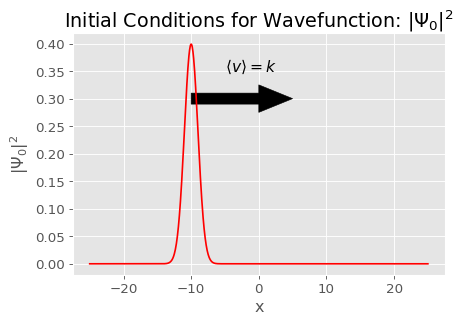

In [8]:
x_0 = -10
k = 5
sigma2 = 1

def gaussian_packet(x, t=0, sigma2=sigma2, k=k, x_0=x_0):
  sigma2t = sigma2 + 1j * t/2
  coeff = np.exp(1j * k**2 * t / 2)/((2 * np.pi * sigma2t**2/sigma2)**(1/4)) * np.exp(1j * k * x)
  return coeff * np.exp(-(x - x_0 - k * t)**2 /(4*sigma2t))

xs = np.linspace(-25,25,1000)
psi = gaussian_packet(xs)
psi2 = (psi.conj() * psi).real

plt.title(r'Initial Conditions for Wavefunction: $|\Psi_0|^2$')
plt.plot(xs, psi2)
plt.ylabel(r'$|\Psi_0|^2$')
plt.xlabel(r'x')
plt.arrow(-10, 0.3, 10, 0, width = 0.02, head_width=0.05, head_length=5, color = 'black')
plt.text(-5, 0.35, r'$\langle v \rangle = k$', color = 'black', fontsize = 14)
print('Normalization: ', np.sum(psi2) * (xs[1]-xs[0]))

In [97]:
# evolution of exact solution in time
def gaussian_evol(dt, t):
  return gaussian_packet(xs, t=t)

ts = np.linspace(0, 10, 1000)
xs = np.linspace(-25,25,1000)
anim = animate(gaussian_evol, xs, ts, title = 'Exact Solution of Dispersing Gaussian Packet')
HTML(anim.to_html5_video())

## Reflective Infinite Potential Barrier

To make a point of infinite potential, we can simply require $\psi_n = 0$ for all $t$ at that point. This is how we keep our particle bounded within a box, and happens implicitely with our numerical integration scheme. In order to get a completely free-particle state, we make a sufficently large box, so that boundary conditions do not affect it. We can add finite potential of any value within this box allowing us to simulate some sort of potential barrier, such as the "edge" of the nucleus of an atom. A completely impenetrable wall can be simulated with an infinite potential, and we will see that the particle is completely reflected by such a configuration. 

In [5]:
class Propagator:

    ''' 
    This py-class was inspired by a similar method in "Computational Quantum Physics" instructed by Professor Giuseppe Carleo at EPFL 2022. This method is 
    incredibly elegant and modularized for all kinds of potentials, and so I draw much inspiration from it. It is an excellent class which I heavily 
    recommend. 
    '''

    def __init__(self, xs, psi_0 = None, V = None):

        ''' 
        Propagator: a class which evolves a scattering state in time, given some potential and the current state. The kinetic energy term of the Hamiltonian
        is omnipresent.

        ARGS:
        - xs - ndarray of x-values (unitless).
        - psi_0 - ndarray initial conditions for the wavefunction at each point, x.
        - V - function R \to R, x \mapsto V(x) which represents the potential energy at each point, x. Default is free particle.
        '''

        self.xs = xs
        self.dx = xs[1] - xs[0]
        
        # if ICs are not specified, psi is a Gaussian wavepacket moving forward with average wave-vector, k
        if psi_0 is None:
            psi_0 = gaussian_packet(xs)
        self.psi = psi_0

        # if V is none, it is a free particle
        if V is None:
            V = lambda x: 0*x

        # Hamiltonian discrete x-basis matrix representation operator in tridiagonal form
        self.H = {
            'diag' : 1/self.dx**2 + V(xs),
            'off-diag': -1/(2*self.dx**2)}
                
        self.H_mat = scipy.sparse.diags([self.H['diag'], self.H['off-diag'] * np.ones(len(xs)-1), self.H['off-diag']* np.ones(len(xs)-1)], [0, -1, 1])
        

    def __call__(self, dt, t):

        # perform an update step on the wavefunction, psi
        U_dt = -1j/2 * dt * self.H_mat + scipy.sparse.identity(len(self.psi)) 
        placeholder = U_dt.dot(self.psi)
        U_dt_dag = U_dt.conj()

        # extract tridiagonal values in matrix for banded eigenvalue solver
        main_diag = U_dt_dag.diagonal(0)
        trid = np.zeros((3, len(main_diag)), dtype=main_diag.dtype)
        trid[0, 1:] = U_dt_dag.diagonal(1)
        trid[1] = main_diag
        trid[2, :-1] = U_dt_dag.diagonal(-1)

        # finish by inverting 
        self.psi = scipy.linalg.solve_banded((1,1), trid, placeholder)

        return self.psi
    
    def expected_energy(self):

        # calculate expected energy of the particle given the current wave function
        return (np.sum(self.psi.T.conj().dot(self.H_mat.dot(self.psi))) * self.dx).real

In [96]:
xs = np.linspace(-30, 30, 1000)
ts = np.linspace(0, 12, 1000)

free_solution = Propagator(xs)
anim = animate(free_solution, xs, ts, title = 'Reflection at Infinite Barrier', poi = 29.99)
HTML(anim.to_html5_video())

### Quantum Tunneling -- A Quantum Particle Transmits Through a Classically Forbidden Potential Barrier

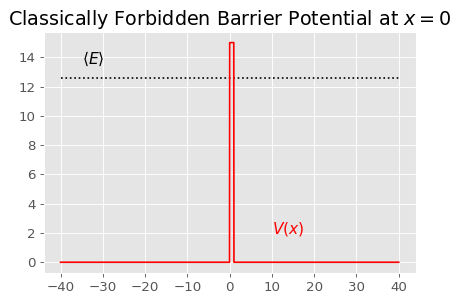

In [41]:
def potential_barrier_zero(x, width = 1, V0 = 15):
    if x < 0 or x > width:
        return 0
    else:
        return V0
    
V_barrier = np.vectorize(potential_barrier_zero)


# demonstration
xs = np.linspace(-40, 40, 2000)
ts = np.linspace(0, 15, 1000)

barrier_solution = Propagator(xs, V=V_barrier)
energy = barrier_solution.expected_energy()


plt.title(r'Classically Forbidden Barrier Potential at $x=0$')
plt.text(xs[0] + 5, energy + 1, r'$\langle E \rangle$', fontsize = 14)
plt.text(10, 2, r'$V(x)$', fontsize = 14, color = 'red')
plt.hlines(energy, xs[0], xs[-1], color = 'black', linestyle = ':')
plt.plot(xs, V_barrier(xs))
plt.show()

In [98]:
xs = np.linspace(-40, 40, 2000)
ts = np.linspace(0, 15, 1000)

barrier_solution = Propagator(xs, V=V_barrier)
anim = animate(barrier_solution, xs, ts, title = 'Classically Forbidden Barrier', poi=0)
HTML(anim.to_html5_video())

#### Let's Estimate the Transmission Coefficient Through the Barrier in a Time Plot

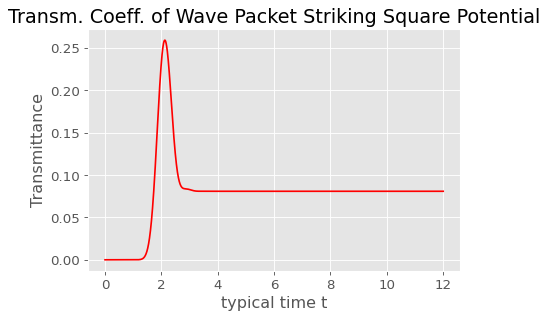

In [82]:
from scipy.integrate import trapz
xs = np.linspace(-40, 40, 2000)
ts = np.linspace(0, 12, 5000)
dt = ts[1] - ts[0]

barrier_solution = Propagator(xs, V=V_barrier)

transmission_values = np.zeros(len(ts))

for i,t in enumerate(ts):

    psi = barrier_solution.psi

    # integrate from 0 onwards to estimate how much has gone through
    T = trapz((np.abs(psi)**2)[round(len(xs)/2)+1:], xs[round(len(xs)/2)+1:])

    transmission_values[i] += T 

    barrier_solution(dt, t)


plt.figure()
plt.xlabel(r'typical time t')
plt.ylabel(r'Transmittance')
plt.title(r'Transm. Coeff. of Wave Packet Striking Square Potential')
plt.plot(ts, transmission_values)
plt.show()

### Kronig-Penney Model

Electron dynamics in lattices, such as metals, are a well-studied topic in solid-state physics. One useful approximation we can make is to model the electric potential of the lattice nuclei as this piece-wise block potential (square waves). We assume that these periodic barriers go on forever, which allows physicists to use Bloch's theorem. This is called the Kronig-Penney model and it has very amazing implications.  Our case will be finite of course, but if we make it sufficiently large, it will behave asymptotically as the infinite potential. 

Bloch's theorem: any stationary wavefunction solution on a periodic potential of period $2L$ can be written as the sum of wavefunctions of the form:
$$
\langle x | \psi_k \rangle = e^{ikx}u(x)
$$

Where $u(x+2L) = u(x)$ is determined by the potential/SE. Why is KP so interesting? A phenomenon in crystals which interests us is "band gaps". KP is the simplest model which exhibits this. What it means, is that certain eigenvalue energies of particles are forbidden! I have not really done much to display these band gaps, but just seeing a scattering state evolve in this potential is fascinating!

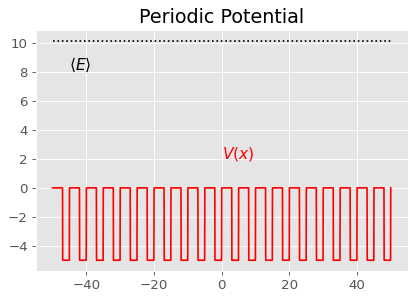

In [54]:
def periodic_barrier(x, a = 5, b = 2, V0 = 5):
    x_p = x % a
    if x_p < a - b:
        return 0
    else:
        return -V0
    
V_periodic = np.vectorize(periodic_barrier)


# demonstration
xs = np.linspace(-50, 50, 2000)
ts = np.linspace(0, 15, 1000)

barrier_solution = Propagator(xs, V=V_periodic)
energy = barrier_solution.expected_energy()


plt.title(r'Periodic Potential')
plt.text(xs[0] + 5, energy - 2, r'$\langle E \rangle$', fontsize = 14)
plt.text(0, 2, r'$V(x)$', fontsize = 14, color = 'red')
plt.hlines(energy, xs[0], xs[-1], color = 'black', linestyle = ':')
plt.plot(xs, V_periodic(xs))
plt.show()

In [56]:
xs = np.linspace(-50, 70, 3000)
ts = np.linspace(0, 50, 2000)

barrier_solution = Propagator(xs, V=V_periodic, psi_0=gaussian_packet(xs, x_0=-40, k=5))
anim = animate(barrier_solution, xs, ts, title = 'Periodic Potential')
HTML(anim.to_html5_video())

In [57]:
def energy_animate(update_func, xs, ts, duration = 10, title = 'Energy', poi = None):

    # we plot Re, Im, and square modulus of the arbitrary initial configuration and hamiltonian
    x_range = (xs[0], xs[-1])
    t_range = (ts[0], ts[-1])
    dx = xs[1] - xs[0]
    dt = ts[1] - ts[0]

    fig, (ax_mod, ax_fft) = plt.subplots(2)

    # params
    fig.set_figheight(6)
    fig.set_figwidth(5)
    fig.suptitle(title)

    ax_mod.set_title(r'$|\Psi(x)|^2$', loc='left')
    ax_fft.set_title(r'$\propto |\Psi(p)|^2$', loc='left')

    ax_mod.set_xlim(*x_range)
    ax_mod.set_xlabel(r'x')

    ax_fft.set_xlabel(r'$k$')

    psi = update_func.psi
    psi_p = np.fft.fft(psi)/np.sqrt(2*np.pi) * dx 
    ps = np.fft.fftfreq(xs.shape[0])/dx * 2 * np.pi

    ax_mod.set_ylim(0, 0.5)
    ax_fft.set_ylim(0, (max(np.abs(psi_p)**2).real))
    ax_fft.set_xlim(0.5*min(ps), 0.5*max(ps))

    fig.tight_layout()

    # initialize blank plot axes

    mod_plot, = ax_mod.plot([], [], lw = 2, color = 'green')
    fft_plot, = ax_fft.plot([], [], lw = 1, color = 'purple')

        
    def update(t):
        psi = update_func(dt, t)

        mod_plot.set_data(xs, np.abs(psi)**2)

        psi_p = np.fft.fft(psi)/np.sqrt(2*np.pi) * dx 
        ps = np.fft.fftfreq(xs.shape[0])/dx * 2 * np.pi
        fft_plot.set_data(ps, np.abs(psi_p)**2)


        return [mod_plot, fft_plot]
    

    # calling the animation function      
    anim = FuncAnimation(fig, update, ts, interval = 1000 * dt / (t_range[-1] - t_range[0]) * duration, blit = True)

    plt.close(fig)
    return anim

In [58]:
xs = np.linspace(-50, 70, 3000)
ts = np.linspace(0, 100, 2000)

barrier_solution = Propagator(xs, V=V_periodic, psi_0=gaussian_packet(xs, x_0=-40, k=5, sigma2=0.1))
anim = energy_animate(barrier_solution, xs, ts, title = 'Periodic Potential')
HTML(anim.to_html5_video())

### Quartic Potential

The Quartic Potential behaves very similarly to the Quantum Harmonic Oscllator potential, but of course, has some minute differences, which can only be described analytically with advanced techniques such as perturbation theory. We will simulate the time evolution of this state.

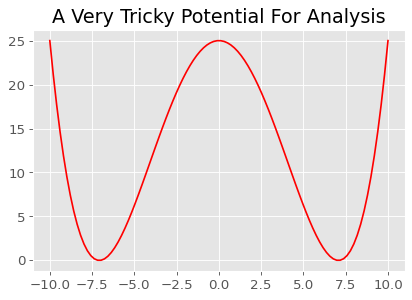

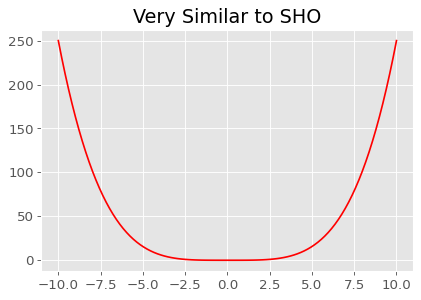

In [75]:
def V_quart(x, a=0, b=0.1, V_0=0):

    return 0.5* a * x**2 + 0.25* b * x**4 + V_0

xs = np.linspace(-10, 10, 100)
plt.title('A Very Tricky Potential For Analysis')
plt.plot(xs, V_quart(xs, a=-2, b=0.04, V_0=25))
plt.show()

plt.title('Very Similar to SHO')
plt.plot(xs, V_quart(xs))
plt.show()

#### Let's put the ground state of the SHO in it, and see if it behaves like a SHO, or if its ground state changes (meaning it isnt pure anymore, spoiler alert)

For the case, $H= \frac{\hat{p}^2}{2m} + \frac{1}{2}m\omega^2 x^2$, the eigenstates of energy are:

$$
\psi_n(x) =\frac{1}{\sqrt{2^n n!}}\Big( \frac{m \omega}{\pi \hbar}\Big)^{1/4} e ^{-\frac{m \omega x^2}{2 \hbar}} H_n \Big( \sqrt{\frac{m \omega}{\hbar}} x\Big)
$$
For $E_n = \hbar \omega (n +\frac{1}{2})$

In [79]:
def ground_sho(x, omega = (0.1)**(1/2)):
    return (omega/np.pi)**(1/4) * np.exp(-omega *x**2/2) 

In [80]:
xs = np.linspace(-10, 10, 3000)
ts = np.linspace(0, 50, 2000)

quart_sol = Propagator(xs, V=V_quart, psi_0=ground_sho(xs))
anim = animate(quart_sol, xs, ts, title = 'Quartic Potential')
HTML(anim.to_html5_video())

We see these wiggles which are caused by the fact that this is not a SHO, but a quartic oscillator. Their energies/eigenstates do not line up exactly, so this will be a mixture of several eigenstates of the quartic oscillator.

For fun, let's throw a wave packet into the quartic potential and watch it decompose into the eigenstates. It should look very weird.

In [81]:
xs = np.linspace(-10, 10, 3000)
ts = np.linspace(0, 50, 2000)

quart_sol = Propagator(xs, V=V_quart, psi_0=gaussian_packet(xs, x_0=1, sigma2=3, k=1))
anim = animate(quart_sol, xs, ts, title = 'Quartic Potential')
HTML(anim.to_html5_video())